# Modelo 1 NLP ampliado - Modelo/Motor de Recomendacion de vinos 


- **Objetivo general de este modelo** : 

obtener un `sistema de recomendacion de vinos` a partir del `input del usuario`. La idea seria que este motor estuviera en la seccion de vinos de unos grandes almacenes/supermercados, o bien en una tablet en un restaurante cuando vamos a pedir bebidas - Esto seria equivalente al trabajo de un soumelier-. El usuario, conociendo el nombre de un vino que le gusta, podria preguntarle al recomendador por vinos similares al vino conocido. La recomendacion se basa en similitudes de cosenos para generar las recomedaciones. Las similitudes las hemos determinado exclusivamente en notas de cata y maridaje y por tanto necesitamos de algorirmos de Procesamiento del Lenguaje Natural (NLP).

Entendemos que estas caracteristicas pueden ser muy utiles para los usuarios, ya que si conoces un vino que te gusta, solo buscaremos recomendaciones en sus caracteristicas organolepticas (visuales, olfativas y gustativas) y para acompañamientos similares de alimentos. Ejemplos de notas de cata tipicas y maridajes por tipo de vino:

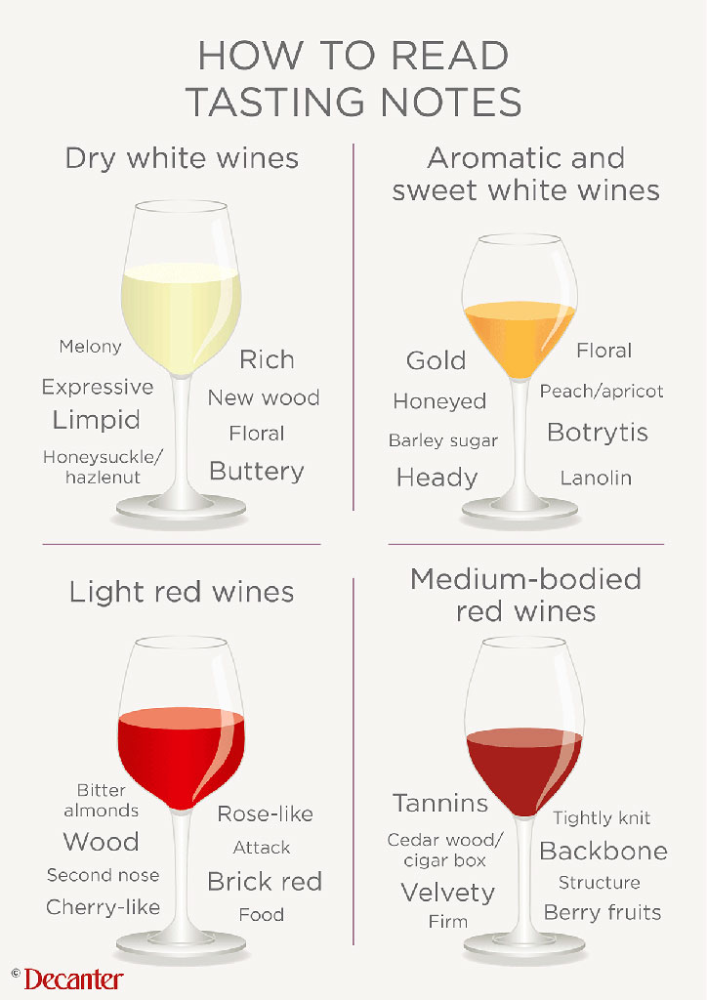

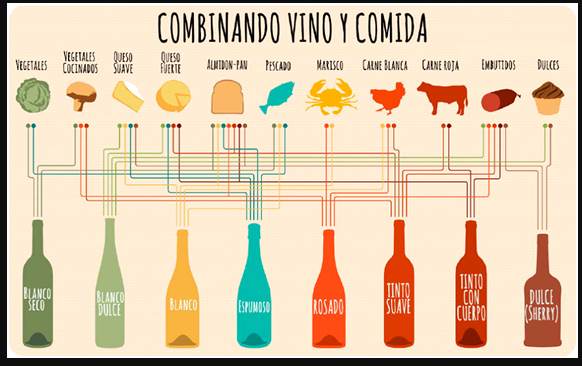


- **Metodos generales del sistema de recomendacion**: 

    - 1. **Web Scrapping**: Hemos sacado todos los 4800 vinos españoles disponibles en la pagina web `bodeboca.como` utilizando paquetes como `beatiful soup`
    - 2. **Preprocesamiento**: Hemos limpiado, revisado NAs del dataset. Despues para las variables/columnas tipo string, hemos pasado a minuscula, limpiado de `stop words` oficiales del castellano, y otras personalizadas que creamos para cada columna, normalizado, tokenizado y lematizado para tener los strings mas limpios (procesamiento de NLP).
    - 3. **EDA**: Hemos revisado los datos haciendo un `EXploratory Data Analysis`
    - 4. **Modelos de recomendacion**: 
        - Una vez normalizado el texto de cata y maridaje, los unimos en una columna: `descripcion` que sera la que usemos como elemento del vino a evaluar. 
        - Utilizamos un modelo preentrenado (transfer learning: `Google Universal Sentence Encoder version 4 (USE)`), para convertir las notas de cata y maridaje (`descripcion`), en vectores de 512 dimensiones para capturar el significado semántico. El USE utiliza una arquitectura de redes neuronales profundas entrenada en grandes corpus de texto.
        - Por último, utilizamos `similitudes de coseno` entre dos vectores que representan vinos para calcular los valores de similitud entre ellos. Esto es lo que usamos para la recomendacion, obteniendo aquellos con el valor más cercano a 1 y así determinar los vinos más afines en función de cata y maridaje.


In [3]:
# Cargamos librerias
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re
from unidecode import unidecode  


from scipy.sparse import csr_matrix
from sklearn.neighbors import NearestNeighbors
import surprise
from surprise import BaselineOnly, Dataset, Reader

import warnings
warnings.filterwarnings('ignore')


import cloudpickle
from tqdm import tqdm
import tensorflow_hub as hub
import numpy as np
from sklearn.manifold import TSNE
import tensorflow as tf 
import math 

## 1. Cargamos el dataset

Cargamos el dataframe de los vinos `df_vinos.csv` que contiene las siguientes columnas:

- titulo: La columna `titulo` contiene el nombre del vino extraido de la pagina bodeboca.com
- link: La columna `link` contiene el link de bodeboca.com para ese vino
- precio: la columna `precio` contiene el precio del vino en abril 2024
- rating: La columna `rating` contiene el rating o valoracion del vino bien por los usuarios de bodeboca.com o de multiples usuarios evaluado en Google u otras paginas de vinos como vinissimuss.com
- bodega: la columna `bodega` contiene el nombre de la bodega a la que pertenece el vino
- tipo: la columna `tipo` contiene la categoria del vino a la que pertenece (), estas pueden ser las siguientes: array(['tinto', 'red vermouth', 'blanco', 'espumoso', 'amontillado', 'oloroso', 'tinto reserva', 'blanco fermentado en barrica', 'white vermouth', 'manzanilla', 'dulce px', 'palo cortado', 'palo cortado vors', 'fino', 'rosado', 'otro(s)', 'tinto joven','tinto crianza', 'amontillado vors', 'oloroso vors','aromatised wine', 'blanco naturalmente dulce', 'tinto dulce', 'blanco dulce', 'orange wine', 'tinto gran reserva', 'cava','sweet moscatel', 'oloroso dulce', 'dulce px vors', 'frizzante','rueda dorado', 'vermut dorado', 'vermouth', 'dulce', 'rancio'],dtype=object)
- grado: la columna `grado` contiene la graduacion en alcohol del vino
- anada: la columna `anada` contiene el año del vino o la añada
- variedad: la columna `variedad` contiene la variedad de uva y sus porcentajes para cada vino
- origen: la coluna `origen` contiene informacion del lugar del que procede el vino
- vista: la coluna `vista` contiene informacion sobre las caracteristicas visuales del vino
- nariz: la coluna `nariz` contiene informacion sobre las caracteristicas olfativas del vino
- boca: la coluna `boca` contiene informacion sobre las caracteristicas gustativas del vino
- temp_servir : la coluna `temp_servir` contiene informacion sobre recomendaciones de temperatura de servicio del vino
- maridaje: la coluna `maridaje` contiene informacion sobre recomendaciones de maridaje/acompanamiento del vino
- clima: la coluna `clima` contiene informacion sobre el clima del lugar donde se producen las cepas del vino
- suelo: la coluna `suelo` contiene informacion sobre el suelo del lugar donde se producen las cepas del vino
- envejecimiento: la coluna `envejecimiento` contiene informacion sobre la crianza del vino
- tipo2: la columna `tipo2` es una variacion de la columna `tipo`. En `tipo2` hemos hecho un reagrupamiento de los tipos en solo 6 clases: tinto, vermouth, blanco, espumoso, generoso, rosado
- variedad2:  la columna `variedad2` es una variacion de la columna `variedad`. En `variedad2` hemos extraido solamente el texto de las variedades de uva y eliminado los %
- cata: la columna `cata` contiene la informacion de cata del vino (vista + nariz + boca)
- fisico: la columna `fisico` contiene la union de la informacion de clima y suelo
- descripcion: la columna `descripcion` contiene la informacion de notas de cata (vista + nariz + boca) mas las notas de maridaje
- descripcion2: la columna `descripcion2` contiene la informacion de la columna `descripcion` donde hemos eliminado stopwords, normalizado, tokenizado y lematizado el texto haciendo un tratamiento de NLP para cada vino 
- fisico2: la columna `fisco2` es una variacion de la columna `fisico`, donde hemos eliminado stopwords, normalizado, tokenizado y lematizado el string de cata para cada vino


In [3]:
# Cargamos los datos
data = pd.read_csv('df_vinos_modelos.csv')
print(data.shape) # el dataset tiene 4792 vinos y 25 columnas

data

(4792, 25)


,titulo,link,precio,rating,bodega,tipo,grado,anada,variedad,origen,...,clima,suelo,envejecimiento,tipo2,variedad2,cata,fisico,descripcion,descripcion2,fisico2
0,sierra cantabria magico 2016,https://bodeboca.com/vino/sierra-cantabria-mag...,594.00,5.0,bodegas vinedos-sierra-cantabria,tinto,14.5,2016.0,"65% tempranillo, 20% garnacha, 4.4% calagraño,...",rioja,...,continental con influencia mediterranea,arcillo-limoso / arcillo-arenoso,crianza en barricas nuevas de roble frances.,tinto,"tempranillo, garnacha, calagraño, turrunte...",rojo cereza / reflejos violaceos / capa media-...,continental con influencia mediterranea arcill...,rojo cereza / reflejos violaceos / capa media-...,rojo cereza reflejos violaceos capa medium alt...,continental influencia mediterranea arcillo li...
1,viña el pison 2019,https://bodeboca.com/vino/vina-el-pison-2019,375.00,5.0,bodegas artadi-vinedos-vinos,tinto,14.5,2019.0,100% tempranillo,vino de españa,...,atlantico con influencia continental,arcillo-calcareo,crianza de 8 meses en barricas de roble.,tinto,tempranillo,"bien definidos, nitidos y transparentes cromat...",atlantico con influencia continental arcillo-c...,"bien definidos, nitidos y transparentes cromat...",bien definidos nitidos transparentes cromatica...,atlantico influencia continental arcillo calcareo
2,artadi la poza de ballesteros 2020,https://bodeboca.com/vino/artadi-la-poza-balle...,105.00,4.7,bodegas artadi-vinedos-vinos,tinto,14.5,2020.0,100% tempranillo,vino de españa,...,2020 se inicio con una primavera lluviosa y fr...,arcillo-calcareo con presencia de limo. profun...,NaN,tinto,tempranillo,"colo rojo picota profundo, capa alta, con nota...",2020 se inicio con una primavera lluviosa y fr...,"colo rojo picota profundo, capa alta, con nota...",colo rojo picota profundo capa alta notas viol...,inicio primavera lluviosa fresca creando unas ...
3,vermut de categorila,https://bodeboca.com/vino/vermut-categorila,7.25,5.0,bodegas bisila,red vermouth,14.0,NaN,"airen, malvasi­a",españa,...,atlantico,albariza,NaN,vermouth,"airen, malvasia","color caoba. aroma a hierbas secas, balsamico,...",atlantico albariza,"color caoba. aroma a hierbas secas, balsamico,...",color caoba aroma hierbas secas balsamico espe...,atlantico albariza
4,el puntido 2020 magnum,https://bodeboca.com/vino/el-puntido-2020-magnum,88.90,5.0,bodegas vinedos-paganos,tinto,14.0,2020.0,100% tempranillo,rioja,...,2020 inicia el ciclo anual con abundantes lluv...,franco-arcilloso por su textura y arcillo-calc...,crianza de 15 meses en barrica nueva de roble ...,tinto,tempranillo,"color rojo picota, con ribete dorado. limpio y...",2020 inicia el ciclo anual con abundantes lluv...,"color rojo picota, con ribete dorado. limpio y...",color rojo picota ribete dorado limpio brillan...,inicia ciclo anual abundantes lluvias noviembr...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4787,tobia seleccion de autor blanco 2021,https://bodeboca.com/vino/tobia-seleccion-auto...,14.20,NaN,bodegas bodegas-tobia,blanco,13.5,2021.0,"50% chardonnay, 50% tempranillo blanco",rioja,...,atlantico.,albariza.,crianza de 7 meses sobre li­as en las mismas b...,blanco,"chardonnay, tempranillo blanco",color dorado intenso con reflejos verdosos. in...,atlantico. albariza.,color dorado intenso con reflejos verdosos. in...,color dorado intenso reflejos verdosos intensa...,atlantico albariza
4788,viña magna 14 meses 2020 magnum,https://bodeboca.com/vino/vina-magna-14-meses-...,52.50,4.8,bodegas dominio-basconcillos,tinto,14.5,2020.0,"90% tinta del pai­s, 10% cabernet sauvignon",ribera del duero,...,continental.,arcilloso-calcareo y franco-arenoso.,crianza de 14 meses en barrica nueva de roble ...,tinto,"tinta del pais, cabernet sauvignon",limpio y brillante. exhibe un intenso color ro...,continental. arcilloso-calcareo y franco-arenoso.,limpio y brillante. exhibe un intenso color ro...,limpio brillante exhibe intenso color rojo gra...,continental arcilloso calcareo fr

## 2. Modelo de recomendacion de vinos - basado en notas de `cata` y `maridaje`

En primer lugar, vamos a utilizar un modelo preentrenado (transfer learning), para convertir las notas de cata y maridaje (`descripcion`), que están en formato texto, a vectores numéricos. Esto es lo que nos va a permitir encontrar recomendaciones. Al final este proceso es una vectorizacion similar al `CountVectorizer` de sklearn.

Para ello, usaremos el `Google Universal Sentence Encoder version 4`, que está disponible en el TensorFlow hub y que convierte cualquier palabra en cualquiera de los siguientes idiomas: Inglés, Español, Francés, Alemán, Italiano, Portugués, Ruso, Chino (simplificado y tradicional), Árabe, Hindi, Japonés y Coreano; en un vector de 512 dimensiones o sentence embedding.

El Universal Sentence Encoder (USE) transforma texto en vectores de 512 dimensiones para capturar el significado semántico. Esta dimensionalidad fue elegida por su equilibrio entre la representación semántica y la eficiencia computacional, permitiendo que el modelo generalice bien en una variedad de tareas de procesamiento de lenguaje natural (NLP).



###  1.2 Similitudes de coseno para generar recomendaciones

Vamos a usar unas funciones que toman dos conjuntos de vectores, calculan la similitud del coseno entre dos vectores de texto y devuelven las incrustaciones más similares a una consulta dada. Son útiles para tareas de recomendación basadas en similitud de texto.

En nuestro caso concreto, una vez transformadas todas las notas de cata en vectores, podemos utilizar la similitud del coseno para obtener aquellos vectores más cercanos a uno dado usando la siguiente fórmula, donde A y B serian los vinos a evaluar:

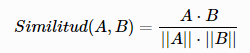

En este caso, nosotros lo transformaremos en una puntuación siguiendo las indicaciones para similitud textual del benchmark STS. En el contexto del benchmark STS (Semantic Textual Similarity), los puntajes de similitud del coseno se miden típicamente en un rango de 0 a 1, donde:

- 0: Indica ninguna similitud entre los dos vectores de texto. Esto significa que los vectores son completamente diferentes y no comparten ninguna similitud semántica.
- 1: Indica una similitud perfecta entre los dos vectores de texto. Esto significa que los vectores son idénticos o muy similares en términos de contenido semántico.

En resumen, los puntajes de similitud del coseno en el benchmark STS proporcionan una medida de la similitud semántica entre dos textos, en nuestro caso las notas de cata y maridaje del vino `A` y las mismas del vino `B`, donde un puntaje más alto indica una mayor similitud y un puntaje más bajo indica una menor similitud.

In [6]:
# creamos las funciones para el motor de recomendacion
def compute_scores(a, b):
    '''
    Esta función calcula la similitud de coseno entre dos conjuntos de vectores normalizados utilizando TensorFlow. 
    
    Input: La función espera dos tensores a y b, donde cada uno representa un conjunto de vectores. Se espera que estos vectores ya estén normalizados en la dimensión 1.
    Output: puntuación de similitud para cada par de vectores de los conjuntos a y b. La puntuación se calcula como la similitud de coseno entre los vectores
    correspondientes en a y b. Se realiza un ajuste adicional para asegurarse de que las similitudes estén dentro del rango [-1, 1], y luego se convierten en puntajes de similitud en el rango [0, 1].
    '''
    a = tf.nn.l2_normalize(a, axis=1)
    b = tf.nn.l2_normalize(b, axis=1)
    cosine_similarities = tf.matmul(a, b, transpose_b = True)
    clip_cosine_similarities = tf.clip_by_value(cosine_similarities, -1.0, 1.0)
    scores = 1.0 - tf.acos(clip_cosine_similarities) / math.pi
    return scores


def get_recommendations(query, embeddings, top_k = 10):
    '''
    Esta función proporciona recomendaciones basadas en similitud de coseno entre un vector de consulta, vino que introducimos del dataset, y una matriz de vectores de incrustación (los embeddings)
    
    Input: La función espera tres argumentos:
        - query: Un vector de consulta, el vino que queramos buscar por posicion del index, que puede ser un único vector o una matriz de vectores
        - embeddings: Una matriz de vectores de incrustación donde se buscarán similitudes con el vector de consulta
        - top_k: El número de elementos más similares que se devolverán como recomendaciones (por defecto es 10), podemos modificarlo.
    '''
    if len(query.shape)==1:
        query = tf.expand_dims(query, 0)
    sim_matrix = compute_scores(query, embeddings)
    rank = tf.math.top_k(sim_matrix, top_k)
    return rank



## 3. Prueba motor de recomendacion de vinos para 1 o varios vinos del dataset

Aplicando las funciones anteriores podemos buscar la recomendacion para un vino rosado `Valdiniebla clarete 2021` que esta en el index 96. 

El query, tiene que ser la fila del dataset de embeddings (recuerda que son los 512 vectores que representan las palabras mas importantes de notas de cata y maridaje) que representa cada vino por lo que podemos llamarlo por su index.

Segun tenemos el codigo, el primer vino siempre sera el que introducimos en la busqueda.

In [7]:
# EJEMPLO
# # Vamos a probar con un vino rosado valdiniebla clarete 2021 --posicion 96
scores, rank = get_recommendations(EMBEDDINGS[(96),:], EMBEDDINGS, top_k = 5)
recomendaciones = data.iloc[rank.numpy().reshape(-1).tolist(), :]
    
# Crear una nueva columna en el DataFrame recomendaciones para almacenar los scores de cada vino en STS
lista_de_listas = scores.numpy().tolist()
lista_scores = [elemento for sublista in lista_de_listas for elemento in sublista]
recomendaciones["Score_similitud"] = lista_scores

recomendaciones

,titulo,link,precio,rating,bodega,tipo,grado,anada,variedad,origen,...,suelo,envejecimiento,tipo2,variedad2,cata,fisico,descripcion,descripcion2,fisico2,Score_similitud
96,la bota de florpower 97 mmxviii,https://bodeboca.com/vino/la-bota-florpower-97...,28.5,3.9,bodegas equipo-navazos,otro(s),12.0,2018.0,100% palomino fino,vino de españa,...,albariza,NaN,generoso,palomino fino,"amarillo dorado, con ligera turbidez natural f...",el clima meridional se compensa con el atlanti...,"amarillo dorado, con ligera turbidez natural f...",amarillo dorado ligera turbidez natural frutos...,clima meridional compensa atlantico proporcion...,0.999890
542,cream el trovador,https://bodeboca.com/vino/cream-el-trovador,12.5,3.5,bodegas bodegas-primitivo-collantes,otro(s),17.5,NaN,"75% palomino fino, 25% moscatel",jerez-xeres-sherry,...,albariza,crianza oxidativa (cabeceo de vino seco y vino...,generoso,"palomino fino, moscatel","amarillo dorado, con ligera turbidez natural f...",atlantico albariza,"amarillo dorado, con ligera turbidez natural f...",amarillo dorado ligera turbidez natural frutos...,atlantico albariza,0.864596
3957,visol brut nature gran reserva 2017,https://bodeboca.com/vino/visol-brut-nature-gr...,25.9,4.1,bodegas mestres,cava,12.0,2017.0,"xareli·lo, macabeo, parellada",cava,...,"de tipo franco-arcilloso y calizo, que permite...",mas de 5 años de crianza en rima. se realizaro...,espumoso,"xarelilo, macabeo, parellada",de color amarillo pajizo y con fini­sima burbu...,mediterraneo. el año 2017 se caracterizo por c...,de color amarillo pajizo y con fini­sima burbu...,color amarillo pajizo fini sima burbuja aporte...,mediterraneo año caracterizo contrastes climat...,0.818346
2015,alfonso oloroso,https://bodeboca.com/vino/alfonso-oloroso,10.5,4.0,bodegas gonzalez-byass,oloroso,18.0,NaN,100% palomino fino,jerez-xeres-sherry,...,calcareo albarizo.,mi­nimo 8 años en botas de roble americano sig...,generoso,palomino fino,color ambar oro. intensos aromas calidos y red...,"el otoño y el invierno son, por lo general, su...",color ambar oro. intensos aromas calidos y red...,color ambar oro intensos aroma calidos redondo...,otoño invierno general suaves primavera period...,0.807199
167,manzanilla pago callejuela 2016 50 cl,https://bodeboca.com/vino/manzanilla-pago-call...,30.7,3.0,bodegas callejuela,manzanilla,16.0,2016.0,100% palomino fino,manzanilla-sanlucar de barrameda,...,albariza.,NaN,generoso,palomino fino,amarillo de capa alta nariz compacta pero bast...,atlantico albariza.,amarillo de capa alta nariz compacta pero bast...,amarillo capa alta nariz compacta bastante aro...,atlantico albariza,0.803137


### 3.1 Recomendaciones para 3 vinos a la vez

En la query podemos meter no solo un vino `a` con la posicion/fila de los EMBEDDINGS[a, :], tambien podemos buscar las top_k recomendaciones para n-vinos asi: EMBEDDINGS[(a,b,..,n), :], aunque lo que hace realmente es sacar los vinos recomendados uno encima de otro. Hace por asi decirlo como un stacking de recomendaciones. Recuerda que con nuestro codigo el primer vino siempre es el que le metemos en la busqueda para tener como referencia.

De la lista de recomendaciones, sacariamos los vinos de la busqueda. A continuacion, calculariamos la media de los `scores de similitud` y podriamos sacar como recomendacion aquiellos vinos que tuvieran un score de similitud en torno al valor de la media.

Esto seria una opcion para difentes vinos, aunque seguro que hay opciones mas limpias y matematicamente mas finas.

In [9]:
# Ejemplo con 3 vinos rosados 
# # Vamos a probar con un vino rosado valdiniebla clarete 2021 --posicion 96
# la rosa 2022 -- posicion 111, y ondipuerko rosado 2020 --> posicion 148
scores, rank = get_recommendations(EMBEDDINGS[(96, 111, 148),:], EMBEDDINGS, top_k = 5)
recomendaciones = data.iloc[rank.numpy().reshape(-1).tolist(), :]
    
# Crear una nueva columna en el DataFrame recomendaciones para almacenar los scores de cada vino en STS
lista_de_listas = scores.numpy().tolist()
lista_scores = [elemento for sublista in lista_de_listas for elemento in sublista]
recomendaciones["Score_similitud"] = lista_scores

recomendaciones

,titulo,link,precio,rating,bodega,tipo,grado,anada,variedad,origen,...,suelo,envejecimiento,tipo2,variedad2,cata,fisico,descripcion,descripcion2,fisico2,Score_similitud
96,la bota de florpower 97 mmxviii,https://bodeboca.com/vino/la-bota-florpower-97...,28.50,3.9,bodegas equipo-navazos,otro(s),12.0,2018.0,100% palomino fino,vino de españa,...,albariza,NaN,generoso,palomino fino,"amarillo dorado, con ligera turbidez natural f...",el clima meridional se compensa con el atlanti...,"amarillo dorado, con ligera turbidez natural f...",amarillo dorado ligera turbidez natural frutos...,clima meridional compensa atlantico proporcion...,1.000000
542,cream el trovador,https://bodeboca.com/vino/cream-el-trovador,12.50,3.5,bodegas bodegas-primitivo-collantes,otro(s),17.5,NaN,"75% palomino fino, 25% moscatel",jerez-xeres-sherry,...,albariza,crianza oxidativa (cabeceo de vino seco y vino...,generoso,"palomino fino, moscatel","amarillo dorado, con ligera turbidez natural f...",atlantico albariza,"amarillo dorado, con ligera turbidez natural f...",amarillo dorado ligera turbidez natural frutos...,atlantico albariza,0.864596
3957,visol brut nature gran reserva 2017,https://bodeboca.com/vino/visol-brut-nature-gr...,25.90,4.1,bodegas mestres,cava,12.0,2017.0,"xareli·lo, macabeo, parellada",cava,...,"de tipo franco-arcilloso y calizo, que permite...",mas de 5 años de crianza en rima. se realizaro...,espumoso,"xarelilo, macabeo, parellada",de color amarillo pajizo y con fini­sima burbu...,mediterraneo. el año 2017 se caracterizo por c...,de color amarillo pajizo y con fini­sima burbu...,color amarillo pajizo fini sima burbuja aporte...,mediterraneo año caracterizo contrastes climat...,0.818346
2015,alfonso oloroso,https://bodeboca.com/vino/alfonso-oloroso,10.50,4.0,bodegas gonzalez-byass,oloroso,18.0,NaN,100% palomino fino,jerez-xeres-sherry,...,calcareo albarizo.,mi­nimo 8 años en botas de roble americano sig...,generoso,palomino fino,color ambar oro. intensos aromas calidos y red...,"el otoño y el invierno son, por lo general, su...",color ambar oro. intensos aromas calidos y red...,color ambar oro intensos aroma calidos redondo...,otoño invierno general suaves primavera period...,0.807199
167,manzanilla pago callejuela 2016 50 cl,https://bodeboca.com/vino/manzanilla-pago-call...,30.70,3.0,bodegas callejuela,manzanilla,16.0,2016.0,100% palomino fino,manzanilla-sanlucar de barrameda,...,albariza.,NaN,generoso,palomino fino,amarillo de capa alta nariz compacta pero bast...,atlantico albariza.,amarillo de capa alta nariz compacta pero bast...,amarillo capa alta nariz compacta bastante aro...,atlantico albariza,0.803137
111,astobiza vermouth extra,https://bodeboca.com/vino/astobiza-vermouth-extra,19.90,3.6,bodegas astobiza,white vermouth,15.5,NaN,100% hondarrabi zuri,españa,...,NaN,NaN,vermouth,hondarrabi zuri,"amarillo pajizo, limpio y brillante. aromas mu...",NaN,"amarillo pajizo, limpio y brillante. aromas mu...",amarillo pajizo limpio brillante aroma intenso...,NaN,0.999731
1494,vermouth blanco mon dieu!,https://bodeboca.com/vino/vermouth-blanco-mon-...,16.50,3.2,bodegas chapeau-wines,white vermouth,15.0,NaN,100% viura,españa,...,NaN,corta crianza de 3 meses en barrica,vermouth,viura,"amarillo pajizo, limpio y brillante. aromas mu...",NaN,"amarillo pajizo, limpio y brillante. aromas mu...",amarillo pajizo limpio brillante aroma intenso...,NaN,0.860637
1562,universo blanco vermouth con estuche,https://bodeboca.com/vino/universo-blanco-verm...,18.90,4.9,bodegas universo-vermouth,white vermouth,16.0,NaN,"50% airen, 50% macabeo",españa,...,NaN,NaN,vermouth,"airen, macabeo","amarillo pajizo, limpio y brillante. aromas mu...",NaN,"amarillo pajizo, limpio y brillante. aromas mu...",amarillo pajizo limpio brillante aroma intenso...,NaN,0.860637
2094,"la bota de vermut blanco seco 123 ""dry navazos""",https://bodeboca.com/vino/la-bota-vermut-blanc...,25.90,NaN,bodegas equipo-navazos,white vermouth,17.0,NaN,100% palomino fino,jerez-xeres-sherry,...,NaN,NaN

In [12]:
# Como los vinos de las busquedas se colocan arriba de cada 5 vinos, eliminamos los vinos buscados asi
indices_a_eliminar = [0, 5, 10]

# Eliminar las filas en las posiciones especificadas
# necesitamos resetear los indices porque sino mantienen los del dataset original
recomendaciones2 = recomendaciones.reset_index().drop(indices_a_eliminar)

# calculamos la media del score de similitud de los vinos seleccionados
print(round(recomendaciones2.Score_similitud.mean(), 2))

recomendaciones2.sort_values(by = "Score_similitud", ascending = False)


0.82


,index,titulo,link,precio,rating,bodega,tipo,grado,anada,variedad,...,suelo,envejecimiento,tipo2,variedad2,cata,fisico,descripcion,descripcion2,fisico2,Score_similitud
1,542,cream el trovador,https://bodeboca.com/vino/cream-el-trovador,12.50,3.5,bodegas bodegas-primitivo-collantes,otro(s),17.5,NaN,"75% palomino fino, 25% moscatel",...,albariza,crianza oxidativa (cabeceo de vino seco y vino...,generoso,"palomino fino, moscatel","amarillo dorado, con ligera turbidez natural f...",atlantico albariza,"amarillo dorado, con ligera turbidez natural f...",amarillo dorado ligera turbidez natural frutos...,atlantico albariza,0.864596
6,1494,vermouth blanco mon dieu!,https://bodeboca.com/vino/vermouth-blanco-mon-...,16.50,3.2,bodegas chapeau-wines,white vermouth,15.0,NaN,100% viura,...,NaN,corta crianza de 3 meses en barrica,vermouth,viura,"amarillo pajizo, limpio y brillante. aromas mu...",NaN,"amarillo pajizo, limpio y brillante. aromas mu...",amarillo pajizo limpio brillante aroma intenso...,NaN,0.860637
7,1562,universo blanco vermouth con estuche,https://bodeboca.com/vino/universo-blanco-verm...,18.90,4.9,bodegas universo-vermouth,white vermouth,16.0,NaN,"50% airen, 50% macabeo",...,NaN,NaN,vermouth,"airen, macabeo","amarillo pajizo, limpio y brillante. aromas mu...",NaN,"amarillo pajizo, limpio y brillante. aromas mu...",amarillo pajizo limpio brillante aroma intenso...,NaN,0.860637
8,2094,"la bota de vermut blanco seco 123 ""dry navazos""",https://bodeboca.com/vino/la-bota-vermut-blanc...,25.90,NaN,bodegas equipo-navazos,white vermouth,17.0,NaN,100% palomino fino,...,NaN,NaN,vermouth,palomino fino,"amarillo pajizo, limpio y brillante. aromas mu...",NaN,"amarillo pajizo, limpio y brillante. aromas mu...",amarillo pajizo limpio brillante aroma intenso...,NaN,0.860637
9,3295,vermouth padro blanco reserva,https://bodeboca.com/vino/vermouth-padro-blanc...,12.25,4.0,NaN,white vermouth,18.0,NaN,xarello,...,NaN,NaN,vermouth,xarello,"amarillo pajizo, limpio y brillante. aromas mu...",NaN,"amarillo pajizo, limpio y brillante. aromas mu...",amarillo pajizo limpio brillante aroma intenso...,NaN,0.860637
2,3957,visol brut nature gran reserva 2017,https://bodeboca.com/vino/visol-brut-nature-gr...,25.90,4.1,bodegas mestres,cava,12.0,2017.0,"xareli·lo, macabeo, parellada",...,"de tipo franco-arcilloso y calizo, que permite...",mas de 5 años de crianza en rima. se realizaro...,espumoso,"xarelilo, macabeo, parellada",de color amarillo pajizo y con fini­sima burbu...,mediterraneo. el año 2017 se caracterizo por c...,de color amarillo pajizo y con fini­sima burbu...,color amarillo pajizo fini sima burbuja aporte...,mediterraneo año caracterizo contrastes climat...,0.818346
3,2015,alfonso oloroso,https://bodeboca.com/vino/alfonso-oloroso,10.50,4.0,bodegas gonzalez-byass,oloroso,18.0,NaN,100% palomino fino,...,calcareo albarizo.,mi­nimo 8 años en botas de roble americano sig...,generoso,palomino fino,color ambar oro. intensos aromas calidos y red...,"el otoño y el invierno son, por lo general, su...",color ambar oro. intensos aromas calidos y red...,color ambar oro intensos aroma calidos redondo...,otoño invierno general suaves primavera period...,0.807199
4,167,manzanilla pago callejuela 2016 50 cl,https://bodeboca.com/vino/manzanilla-pago-call...,30.70,3.0,bodegas callejuela,manzanilla,16.0,2016.0,100% palomino fino,...,albariza.,NaN,generoso,palomino fino,amarillo de capa alta nariz compacta pero bast...,atlantico albariza.,amarillo de capa alta nariz compacta pero bast...,amarillo capa alta nariz compacta bastante aro...,atlantico albariza,0.803137
11,264,a telleira parcelas 2022,https://bodeboca.com/vino/telleira-parcelas-2022,10.90,3.9,bodegas genus-vinum,blanco,13.0,2022.0,"treixadura, godello",...,franco-arenosos.,NaN,blanco,"treixadura, godello",pajizo palido toques a manzana y frutas citric...,atlantico. franco-arenosos.,pajizo palido toques a manzana y frutas citric...,pajizo palido toque manzana frutas citricas hi...,atlantico franco arenoso

In [13]:
filtro = (recomendaciones2["Score_similitud"] >= 0.80) & (recomendaciones2["Score_similitud"] <= 0.81)
resultados_filtrados = recomendaciones2[filtro]
resultados_filtrados

,index,titulo,link,precio,rating,bodega,tipo,grado,anada,variedad,...,suelo,envejecimiento,tipo2,variedad2,cata,fisico,descripcion,descripcion2,fisico2,Score_similitud
3,2015,alfonso oloroso,https://bodeboca.com/vino/alfonso-oloroso,10.5,4.0,bodegas gonzalez-byass,oloroso,18.0,NaN,100% palomino fino,...,calcareo albarizo.,mi­nimo 8 años en botas de roble americano sig...,generoso,palomino fino,color ambar oro. intensos aromas calidos y red...,"el otoño y el invierno son, por lo general, su...",color ambar oro. intensos aromas calidos y red...,color ambar oro intensos aroma calidos redondo...,otoño invierno general suaves primavera period...,0.807199
4,167,manzanilla pago callejuela 2016 50 cl,https://bodeboca.com/vino/manzanilla-pago-call...,30.7,3.0,bodegas callejuela,manzanilla,16.0,2016.0,100% palomino fino,...,albariza.,NaN,generoso,palomino fino,amarillo de capa alta nariz compacta pero bast...,atlantico albariza.,amarillo de capa alta nariz compacta pero bast...,amarillo capa alta nariz compacta bastante aro...,atlantico albariza,0.803137
11,264,a telleira parcelas 2022,https://bodeboca.com/vino/telleira-parcelas-2022,10.9,3.9,bodegas genus-vinum,blanco,13.0,2022.0,"treixadura, godello",...,franco-arenosos.,NaN,blanco,"treixadura, godello",pajizo palido toques a manzana y frutas citric...,atlantico. franco-arenosos.,pajizo palido toques a manzana y frutas citric...,pajizo palido toque manzana frutas citricas hi...,atlantico franco arenosos,0.800941


## 4. Recomendador de vino interactivo con el usuario

In [34]:
# FUNCION DE RECOMENDACION DE VINOS
def buscar_vino_y_recomendar(data, EMBEDDINGS, get_recommendations):
    """
    Esta función busca un vino específico en el DataFrame de bodeboca.com de vinos de España y luego recomienda vinos similares
    basados en los embeddings de los vinos encontrados. top_k=n determina los numero de vinos (n) que queremos mostrar como resultado del recomendador.
    Por defecto, si no se pone nada seria top_k = 10

    Argumentos:
        - data (pandas.DataFrame): DataFrame que contiene información sobre los vinos, incluido el título del vino.
        - EMBEDDINGS (numpy.ndarray): Matriz de embeddings donde cada fila representa el embedding de un vino.
        - get_recommendations (callable): Función que recibe embeddings y devuelve recomendaciones basadas en similitud.

    Returns:
        - pandas.DataFrame: DataFrame que contiene información sobre los vinos recomendados, incluida su similitud. El primer vino siempre es el que
        introduce el usuario. Si no se encuentra el vino buscado, se devuelve un DataFrame vacío.
    """
    # Solicitar al usuario que ingrese el vino que desea verificar
    texto_busqueda = input("Ingrese el nombre del vino que desea buscar: ")

    # Normalizar el texto de búsqueda (eliminando acentos y convirtiendo a minúsculas)
    texto_busqueda = unidecode(texto_busqueda).lower()

    # Crear una expresión regular que coincida con cualquier texto que contenga las palabras en cualquier orden y con cualquier cantidad de palabras intermedias
    patron = '.*'.join(re.escape(word) for word in texto_busqueda.split())

    # Crear una máscara booleana que identifique las filas donde el texto está presente en la columna de interés
    mascara = data['titulo'].str.lower().apply(unidecode).str.contains(patron, flags=re.IGNORECASE)

    # Usar la máscara para filtrar el DataFrame original y obtener las filas que cumplen con la condición
    resultados = data[mascara].reset_index()

    # Imprimir los resultados
    if len(resultados) > 0:
        print("Hemos encontrado", len(resultados), "vino/s en nuestro sistema")
        print("Resultados de la búsqueda:")
        print(resultados.titulo)
        
        # Solicitar al usuario que ingrese el vino para el cual desea buscar una recomendación
        vino = input("Por favor, ingrese el nombre del vino para el cual desea buscar una recomendación: ")

        # Normalizar el texto de búsqueda (eliminando acentos y convirtiendo a minúsculas)
        vino = unidecode(vino).lower()

        # Crear una expresión regular que coincida con cualquier texto que contenga las palabras en cualquier orden y con cualquier cantidad de palabras intermedias
        patron2 = '.*'.join(re.escape(word) for word in vino.split())

        # Crear una máscara booleana que identifique las filas donde el texto está presente en la columna de interés
        mascara = data['titulo'].str.lower().apply(unidecode).str.contains(patron2, flags=re.IGNORECASE)

        # Obtener los índices de las filas que cumplen con la condición
        indices = data[mascara].index

        # Calcular las recomendaciones utilizando los índices de los vinos encontrados
        scores, rank = get_recommendations(EMBEDDINGS[indices,:], EMBEDDINGS, top_k=8)
        recomendaciones = data.iloc[rank.numpy().reshape(-1).tolist(), :]

        # Crear una nueva columna en el DataFrame de recomendaciones para almacenar los scores de similitud de cada vino
        lista_de_listas = scores.numpy().tolist()
        lista_scores = [elemento for sublista in lista_de_listas for elemento in sublista]
        recomendaciones["Score_similitud"] = lista_scores

        # Imprimir la selección de vinos con información adicional
        print("Los vinos más afines a su vino son los siguientes:")
        # print(recomendaciones)
        
        # Devolver el DataFrame de recomendaciones como resultado de la función
        return recomendaciones

    else:
        print("Su vino no se encuentra en nuestra base de datos")


#     # Devolver el DataFrame de recomendaciones como resultado de la función
#     return recomendaciones


In [43]:
resultados_recomendaciones.columns

Index(['titulo', 'link', 'precio', 'rating', 'bodega', 'tipo', 'grado',
       'anada', 'variedad', 'origen', 'vista', 'nariz', 'boca', 'temp_servir ',
       'maridaje', 'clima', 'suelo', 'envejecimiento', 'tipo2', 'variedad2',
       'cata', 'fisico', 'descripcion', 'descripcion2', 'fisico2',
       'Score_similitud'],
      dtype='object')

In [78]:
# Llamar a la función buscar_vino_y_recomendar
resultados_recomendaciones = buscar_vino_y_recomendar(data, EMBEDDINGS, get_recommendations)

# Mostrar los resultados
print("Vinos recomendados:")
resultados_recomendaciones.loc[:, ["titulo", "vista", "nariz", "boca", "tipo", "tipo2", "origen", "maridaje", "variedad", "precio", "rating", "Score_similitud", "link", "descripcion"]]


Ingrese el nombre del vino que desea buscar:  albarino


Hemos encontrado 34 vino/s en nuestro sistema
Resultados de la búsqueda:
0                         o raio da vella albariño 2018
1                               morgadi­o albariño 2022
2                albariño do ferreiro cepas vellas 2022
3                           mosen anselmo albariño 2022
4                    la casa de las locas albariño 2022
5                                albariño portomar 2022
6                                  zarate albariño 2022
7                                  la val albariño 2022
8                                 la poda albariño 2022
9                la fuga finca a xesteira albariño 2015
10                              rosa ruiz albariño 2022
11                    albariño do ferreiro lourido 2022
12                marchamalo albariño ri­as baixas 2021
13                       albariño finca casa julia 2021
14      marco real albariño by marti­n berasategui 2022
15                      1583 albariño de fefiñanes 2022
16                      albariñ

Por favor, ingrese el número del vino para el cual desea buscar una recomendación:  atlantis albariño 2022


Los vinos más afines a su vino son los siguientes:
Vinos recomendados:


,titulo,vista,nariz,boca,tipo,tipo2,origen,maridaje,variedad,precio,rating,Score_similitud,link,descripcion
4158,atlantis albariño 2022,"color amarillo limon, limpio y brillante.",en nariz se presenta muy intenso y con aromas ...,"en boca es largo, glicerico, persistente y con...",blanco,blanco,ri­as baixas,"ideal para acompañar pescados, mariscos, queso...",100% albariño,15.65,3.7,0.999810,https://bodeboca.com/vino/atlantis-albarino-2022,"color amarillo limon, limpio y brillante. en n..."
397,loess verdejo collection 2021,de color amarillo intenso con tonos verdes. vi...,al principio aparecen con intensidad los aroma...,"entrada suave, agradable y envolvente. es un v...",blanco fermentado en barrica,blanco,rueda,ideal con pescados azules a la parrilla y carn...,100% verdejo,16.90,3.7,0.837118,https://bodeboca.com/vino/loess-verdejo-collec...,de color amarillo intenso con tonos verdes. vi...
2016,freixenet brut barroco,"color amarillo limon, limpio y brillante, burb...","intensos aromas de crianza, aromas ci­tricos (...","buena estructura en boca, con fondos frescos y...",cava,espumoso,cava,"buena armoni­a con embutidos, pescados de roca...","macabeo, xarello, parellada",12.90,3.9,0.836230,https://bodeboca.com/vino/freixenet-brut-barroco,"color amarillo limon, limpio y brillante, burb..."
3666,impromptu sauvignon blanc 2023,color amarillo con reflejos verdosos.,"de intensidad muy alta, complejo de fondo mine...","con buen peso de fruta, untuoso, denso, buena ...",blanco fermentado en barrica,blanco,utiel - requena,"mariscos, pescado, quesos curados, verduras, a...",100% sauvignon blanc,23.50,5.0,0.834959,https://bodeboca.com/vino/impromptu-sauvignon-...,color amarillo con reflejos verdosos. de inten...
904,montrubi­ white 2021,color amarillo palido.,"aromas a manzana verde, pera limonera, piel de...","mucha fruta en boca, notas de hierbas y final ...",blanco,blanco,penedes,"ideal para acompañar pescados, mariscos, queso...",100% xareli·lo,10.50,3.8,0.833385,https://bodeboca.com/vino/montrubi-white-2021,"color amarillo palido. aromas a manzana verde,..."
1647,txakoli k5 2020,de color amarillo verdoso palido y destellos v...,intensa y expresiva. exhibe notas de manzana r...,"redonda, fresca y glicerica. su concentracion ...",blanco,blanco,txakoli de getaria,"ideal con mariscos y pescados crudos, al horno...",100% hondarrabi zuri,19.75,NaN,0.828644,https://bodeboca.com/vino/txakoli-k5-2020,de color amarillo verdoso palido y destellos v...
3406,cara nord blanc 2022,color amarillo pajizo brillante.,"combinacion de aromas exoticos (piña tropical,...",rotunda con acidez equilibrada por un toque gl...,blanco,blanco,conca de barberi,"ideal para acompañar pescados, mariscos, queso...","macabeo, chardonnay, trepat",11.90,4.5,0.828449,https://bodeboca.com/vino/cara-nord-blanc-2022,color amarillo pajizo brillante. combinacion d...
2698,gargalo godello 2022,de color amarillo brillante con destellos verd...,"potente y fresca. exhibe notas minerales, ci­t...","untuosa, armoniosa y pura.",blanco,blanco,monterrei,"ideal para acompañar pescados, mariscos, queso...",100% godello,12.90,4.5,0.827018,https://bodeboca.com/vino/gargalo-godello-2022,de color amarillo brillante con destellos verd...


In [33]:
type(EMBEDDINGS)

numpy.ndarray

## 5. Visualizacion de similitud de vinos de forma interactiva

Es interesante poder obtener un listado de recomendaciones dado un vino en funcion de sus caracteristicas de cata y maridaje. Pero igualmente interesante el poder explorar de manera interactiva los resultados. Para ello, usaremos T-SNE para reducir la dimensionalidad de 512 a 2 dimensiones.

T-SNE (t-Distributed Stochastic Neighbor Embedding) es un algoritmo de reducción de dimensionalidad no lineal que se utiliza comúnmente para visualizar conjuntos de datos de alta dimensión en un espacio de menor dimensión, típicamente 2D o 3D. La reducción de la dimensionalidad se realiza de manera que los puntos que están cerca en el espacio de alta dimensión permanezcan cercanos en el espacio de baja dimensión, mientras que los puntos que están lejos en el espacio de alta dimensión tienden a estar más separados en el espacio de baja dimensión.

El proceso básico de T-SNE implica lo siguiente:

1. **Calcula probabilidades de similitud**: Para cada par de puntos en el espacio de alta dimensión, T-SNE calcula las probabilidades condicionales de que esos puntos estén relacionados entre sí, utilizando una medida de similitud basada en la distribución de la vecindad.

2. **Construye una distribución similar en el espacio de baja dimensión**: T-SNE luego construye una distribución similar en el espacio de baja dimensión y ajusta sus parámetros para que sea lo más similar posible a la distribución de probabilidades en el espacio de alta dimensión.

3. **Minimiza la divergencia de Kullback-Leibler**: Utiliza un método iterativo para minimizar la divergencia de Kullback-Leibler entre las dos distribuciones. Esto implica ajustar la posición de los puntos en el espacio de baja dimensión para que la distribución de similitud entre ellos sea lo más parecida posible a la distribución de similitud en el espacio de alta dimensión.

4. **Visualiza los datos**: Una vez que se ha completado el proceso de optimización, T-SNE proporciona una representación de baja dimensión de los datos que puede ser visualizada para ayudar a comprender la estructura y las relaciones entre los puntos en el conjunto de datos original de alta dimensión.

En resumen, T-SNE es una técnica muy útil para visualizar datos de alta dimensión en un espacio de menor dimensión de una manera que preserve las relaciones y la estructura subyacente en los datos originales.


In [16]:
# Obtener todos los índices disponibles
idxs = tf.range(tf.shape(EMBEDDINGS)[0])

# Utilizar todos los índices para seleccionar todas las muestras
rinput = tf.gather(EMBEDDINGS, idxs)

# Seleccionar todas las filas y las columnas deseadas para visualizar
descriptions = data.loc[:, ['titulo', 'tipo2', 'tipo', 'origen', 'variedad', 'bodega', 'precio', 'rating', 'descripcion']]


In [17]:
# T-SNE: reducción de dimensionalidad utilizando el algoritmo t-SNE en 2 dimensiones
X_embedded = TSNE(n_components=2).fit_transform(rinput)

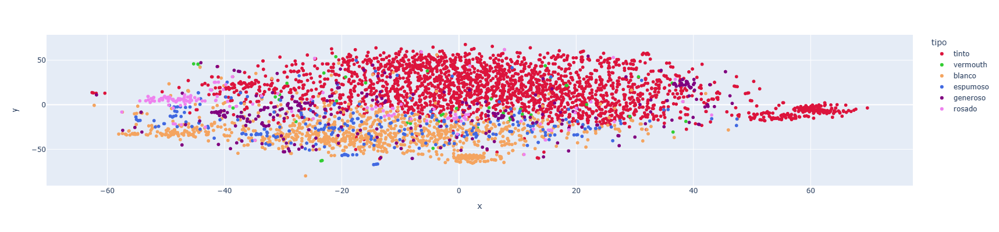

In [19]:
# creamos un plot 2d interactivo donde los vinos cercanos son mas afines a uno dado
import plotly.express as px

# Definimos un mapeo de colores para los tipos de vinos
color_map = {
    'tinto': 'crimson',
    'blanco': 'sandybrown', #'gold',
    'espumoso': 'royalblue',
    'generoso': 'purple',
    'rosado': 'violet', 
    'vermouth': 'limegreen'
}

fig = px.scatter(pd.DataFrame({'x': X_embedded[:,0], 
                               'y': X_embedded[:,1], 
                               'origen':descriptions['origen'],
                               'nombre':descriptions['titulo'],
                               'tipo':descriptions['tipo2'],
                               'precio':descriptions['precio'],
                               'variedad':descriptions['variedad'],
                               'descripcion':descriptions['descripcion'],
                               'bodega':descriptions['bodega']
                              
                              }).dropna(), 
                 x='x', y='y', color='tipo', hover_name="nombre",
                 hover_data=["origen", "precio", "variedad", "bodega"],
                 color_discrete_map=color_map,  # Utiliza el mapeo de colores personalizado
                 width=700, height=400
                )
fig.update_traces(marker_size = 6)
fig.show()

En el grafico interactivo de arriba, podemos observar que la reduccion de dimensiones de 512 vectores que teniamos para describir las notas de cata y maridaje a 2 dimensiones (x e y) funcionan muy bien para agrupar los vinos. 

- en los `vinos tintos` (color rojo) se observa que tienen unas notas de cata y maridaje muy definidas, aunque hay unos vinos tintos en la margen dereche que parece que tienen algunas caracteristicas bien diferentes de la mayoria que se agrupan hacia arriba en el plot

- los `vinos blancos` (color naranja) tambien parecen tener notas de cata y maridaje bien definidas y en general se separan bien de los tintos, salvo en algunos casos sueltos

- los `vermouths` (color verde) vemos que se distribuyen tando entre vinos tintos y blancos, y esto se debe a que estos vinos son muy variados, pudiendo ser vermouths tintos o blancos

- los `vinos espumosos` (color azul) vemos que se agrupan sobre todo con los blancos, aunque hay algunos, no muchos que se solapan con los tintos en cata y maridaje

- los `vinos generoros` (color morado) vemos que se distribuyen en torno al borde de los vinos tintos y se solapan con los blancos. Hay que tener en cuenta que nosotros hemos creado el tipo2 de vino generoso englobando vinos con alta graduacion alcoholica, y vinos dulces, olorosos, manzanillas, moscateles, vinos rancios ...etc, por lo que esta categoria es un poco miscelanea y es correcto que nos de este resultado

- los `vinos rosados` (color rosa) vemos que se distribuyen generalmente en la zona limitrofe entre los tintos y los blancos, en general


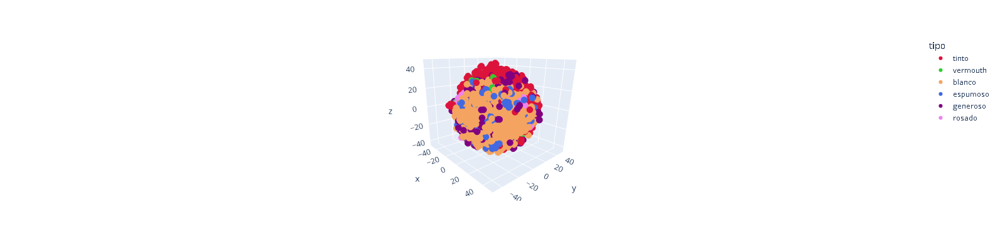

In [43]:
# T-SNE: reducción de dimensionalidad utilizando el algoritmo t-SNE en 3 dimensiones
X_embedded = TSNE(n_components=3).fit_transform(rinput)

import plotly.express as px

# Definimos un mapeo de colores para los tipos de vinos
color_map = {
    'tinto': 'crimson',
    'blanco': 'sandybrown', 
    'espumoso': 'royalblue',
    'generoso': 'purple',
    'rosado': 'violet', 
    'vermouth': 'limegreen'
}

fig = px.scatter_3d(pd.DataFrame({'x': X_embedded[:,0], 
                                  'y': X_embedded[:,1], 
                                  'z': X_embedded[:,2], 
                                  'origen':descriptions['origen'],
                                  'nombre':descriptions['titulo'],
                                  'tipo':descriptions['tipo2'],
                                  'precio':descriptions['precio'],
                                  'variedad':descriptions['variedad'],
                                  'bodega':descriptions['bodega']
                                 
                                 }).dropna(), 
                    x='x', y='y', z='z', color='tipo', hover_name="nombre",
                    hover_data=["origen", "precio", "variedad", "bodega"],
                    color_discrete_map=color_map,  # Utiliza el mapeo de colores personalizado
                    width=700, height=400
                   )
fig.update_traces(marker_size = 6)
fig.show()

El plot en 3 dimensiones de las notas de cata y maridaje muestra lo mismo que explicamos mas arriba.

## 5. Experimentos word cloud
https://python-charts.com/ranking/wordcloud-matplotlib/?utm_content=cmp-true

Prueba con tinto de forlong - Petit Forlong

<Figure size 640x480 with 0 Axes>

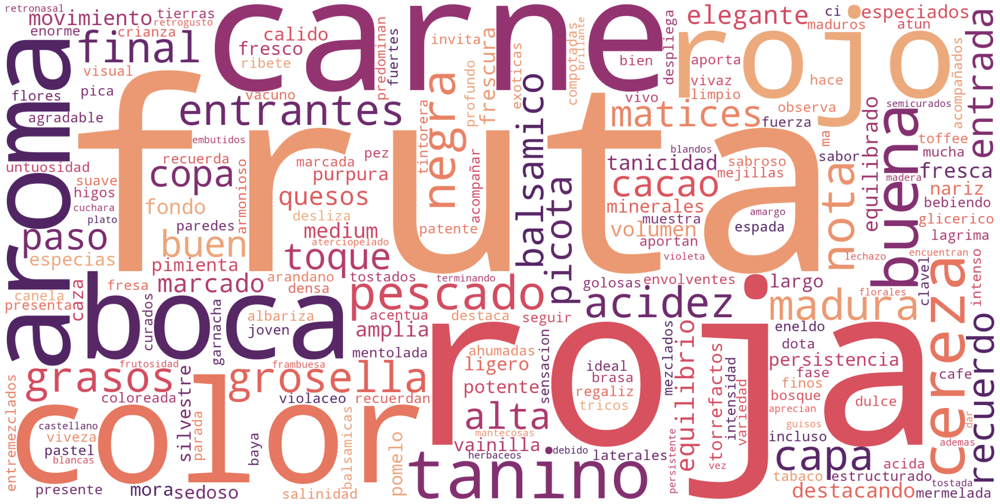

In [69]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

all_words_str = resultados_recomendaciones['descripcion2'].str.cat(sep=' ')
all_words_str = all_words_str.lower()

# Función para graficar la nube de palabras
def plot_cloud(wordcloud):
    plt.figure(figsize=(30, 20))
    plt.imshow(wordcloud) 
    plt.axis("off")
    plt.savefig('wordcloud.jpg')  # Guardar la imagen como wordcloud.jpg
    plt.show()

# Generar la nube de palabras
wordcloud = WordCloud(width=2000, height=1000, random_state=1, background_color='white', 
                      colormap='flare', collocations=False).generate(all_words_str)

# # Guardar el plot como jpg
plt.savefig('cloud_tinto_forlong.jpg')

# Mostrar y guardar la nube de palabras
plot_cloud(wordcloud)

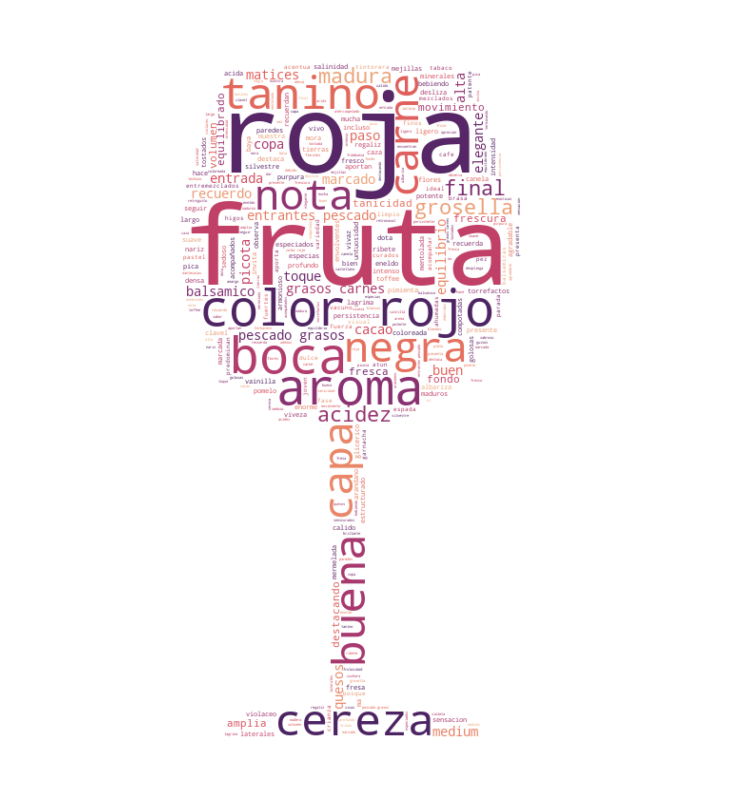

In [67]:
import numpy as np
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from PIL import Image

# Concatenar todas las descripciones en un solo texto
all_descriptions = resultados_recomendaciones['descripcion2'].str.cat(sep=' ').lower()

# Cargar la imagen de la máscara
mask = np.array(Image.open("copa_vino.png"))  # Asegúrate de que la imagen "copa_vino.png" esté en tu carpeta de trabajo

# Configurar la WordCloud con la máscara y generar la nube de palabras
wc = WordCloud(background_color="white", repeat=True, mask=mask, colormap='flare').generate(all_descriptions)

# Crear y mostrar la figura
plt.figure(figsize=(15, 10))  # Modifica el tamaño aquí (ancho, alto)
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
#plt.title("Nube de palabras - Descripciones de Vinos", fontsize=20, fontweight="bold", color="black", style="italic")

# # Guardar el plot como jpg
plt.savefig('cloud_copa_tinto_forlong.jpg')

plt.show()


### 5.1 Nube de palabras para todos los tintos

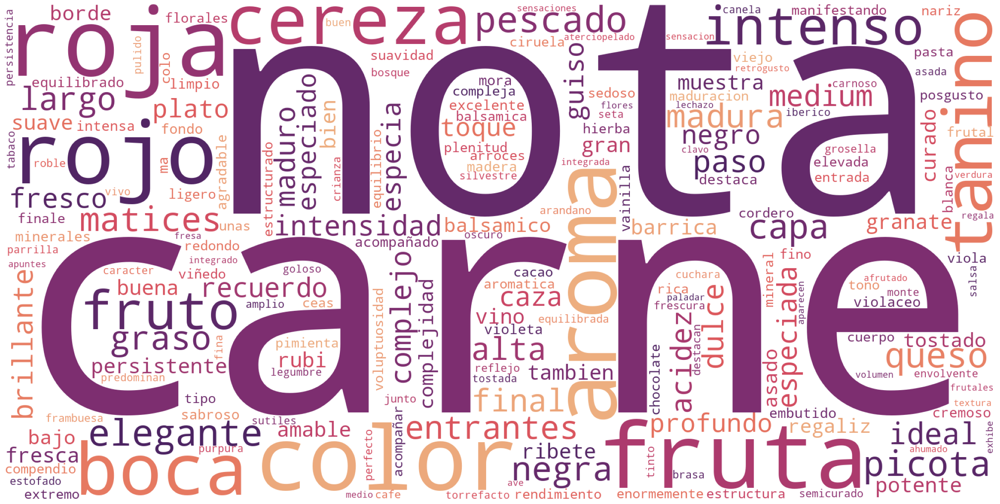

In [65]:
tintos =  data[data["tipo2"] == "tinto"]

# NUBE PARA todos los tintos
all_words_str = tintos['descripcion2'].str.cat(sep=' ')
all_words_str = all_words_str.lower()

# Función para graficar la nube de palabras
def plot_cloud(wordcloud):
    plt.figure(figsize=(30, 20))
    plt.imshow(wordcloud) 
    plt.axis("off")
    plt.savefig('wordcloud.jpg')  # Guardar la imagen como wordcloud.jpg
    plt.show()

# Generar la nube de palabras
wordcloud = WordCloud(width=2000, height=1000, random_state=1, background_color='white', 
                      colormap='flare', collocations=False).generate(all_words_str)

# # Guardar el plot como jpg
# plt.savefig('cloud_.jpg')

# Mostrar y guardar la nube de palabras
plot_cloud(wordcloud)

### 5.2 Prueba con blanco albarino - atlantis albariño 2022

In [ ]:
resultados_recomendaciones

,titulo,link,precio,rating,bodega,tipo,grado,anada,variedad,origen,...,suelo,envejecimiento,tipo2,variedad2,cata,fisico,descripcion,descripcion2,fisico2,Score_similitud
4158,atlantis albariño 2022,https://bodeboca.com/vino/atlantis-albarino-2022,15.65,3.7,productores vintae,blanco,12.5,2022.0,100% albariño,ri­as baixas,...,suelos arenosos de fondo grani­tico.,NaN,blanco,albariño,"color amarillo limon, limpio y brillante. en n...",añada con muchas complicaciones en casi toda g...,"color amarillo limon, limpio y brillante. en n...",color amarillo limon limpio brillante nariz pr...,añada muchas complicaciones casi toda galicia ...,0.999810
397,loess verdejo collection 2021,https://bodeboca.com/vino/loess-verdejo-collec...,16.90,3.7,bodegas loess,blanco fermentado en barrica,13.5,2021.0,100% verdejo,rueda,...,gran cantidad de piedras redondeadas o cascajo...,no se trasiega. permanece en contacto con sus ...,blanco,verdejo,de color amarillo intenso con tonos verdes. vi...,continental. gran cantidad de piedras redondea...,de color amarillo intenso con tonos verdes. vi...,color amarillo intenso tonos verdes vino limpi...,continental gran cantidad piedras redondeadas ...,0.837118
2016,freixenet brut barroco,https://bodeboca.com/vino/freixenet-brut-barroco,12.90,3.9,bodegas freixenet,cava,12.0,NaN,"macabeo, xarello, parellada",cava,...,arcillo-calcareo.,crianza en rima superior a 24 meses. dosaje de...,espumoso,"macabeo, xarello, parellada","color amarillo limon, limpio y brillante, burb...",mediterraneo. arcillo-calcareo.,"color amarillo limon, limpio y brillante, burb...",color amarillo limon limpio brillante burbuja ...,mediterraneo arcillo calcareo,0.836230
3666,impromptu sauvignon blanc 2023,https://bodeboca.com/vino/impromptu-sauvignon-...,23.50,5.0,bodegas bodegas-hispanosuizas,blanco fermentado en barrica,14.0,2023.0,100% sauvignon blanc,utiel - requena,...,calizo-arcillosos.,una vez finalizada la fermentacioìn se mantie...,blanco,sauvignon blanc,color amarillo con reflejos verdosos. de inten...,continental con influencias mediterraneas. cal...,color amarillo con reflejos verdosos. de inten...,color amarillo reflejos verdosos intensidad al...,continental influencias mediterraneas calizo a...,0.834959
904,montrubi­ white 2021,https://bodeboca.com/vino/montrubi-white-2021,10.50,3.8,bodegas montrubi,blanco,12.0,2021.0,100% xareli·lo,penedes,...,"calcareo-arenoso, poco productivo.",NaN,blanco,xarelilo,"color amarillo palido. aromas a manzana verde,...","atlantico. calcareo-arenoso, poco productivo.","color amarillo palido. aromas a manzana verde,...",color amarillo palido aroma manzana verde pera...,atlantico calcareo arenoso productivo,0.833385
1647,txakoli k5 2020,https://bodeboca.com/vino/txakoli-k5-2020,19.75,NaN,bodegas k5,blanco,12.0,2020.0,100% hondarrabi zuri,txakoli de getaria,...,de orografi­a ondulada formado por esquistos d...,crianza de al menos 11 meses sobre sus li­as e...,blanco,hondarrabi zuri,de color amarillo verdoso palido y destellos v...,con caracter atlantico. de orografi­a ondulada...,de color amarillo verdoso palido y destellos v...,color amarillo verdoso palido destellos verde ...,caracter atlantico orografi ondulada formado e...,0.828644
3406,cara nord blanc 2022,https://bodeboca.com/vino/cara-nord-blanc-2022,11.90,4.5,bodegas cara-nord,blanco,11.5,2022.0,"macabeo, chardonnay, trepat",conca de barberi,...,"pobre de pizarra, cantos y arcillo-calcareo co...",3 meses sobre li­as finas en deposito.,blanco,"macabeo, chardonnay, trepat",color amarillo pajizo brillante. combinacion d...,continental-mediterraneo con noches fri­as que...,color amarillo pajizo brillante. combinacion d...,color amarillo pajizo brillante combinacion ar...,continental mediterraneo noches fri permiten d...,0.828449
2698,gargalo godello 2022,https://bodeboca.com/vino/gargalo-godello-2022,12.90,4.5,bodegas bodegas-riojanas,blanco,13.0,2022.0,100% godello,monterrei,...,grani­tico-arenosos con zonas de arcilla.,permanece aproximadamente 4

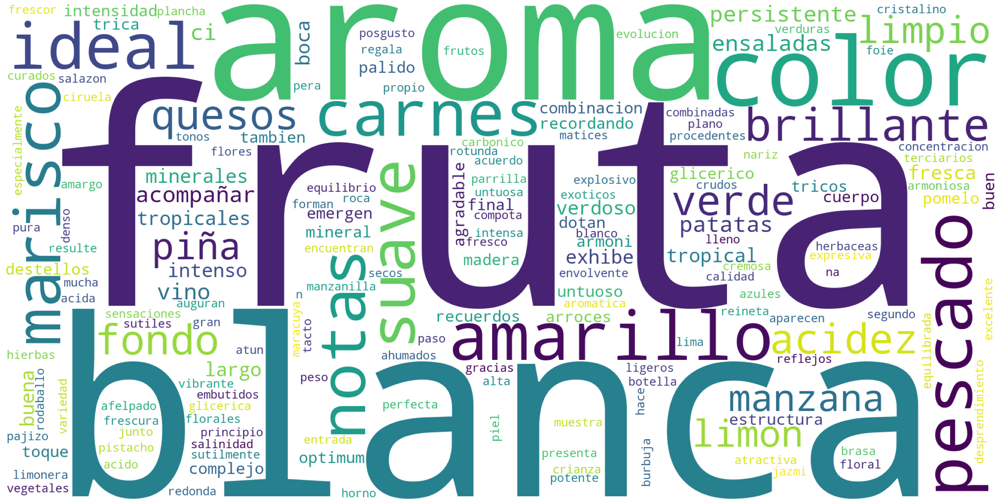

In [81]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

all_words_str = resultados_recomendaciones['descripcion2'].str.cat(sep=' ')
all_words_str = all_words_str.lower()

# Función para graficar la nube de palabras
def plot_cloud(wordcloud):
    plt.figure(figsize=(30, 20))
    plt.imshow(wordcloud) 
    plt.axis("off")
    plt.savefig('atlantis_albariño_2022.jpg')  # Guardar la imagen como wordcloud.jpg
    plt.show()

# Generar la nube de palabras
wordcloud = WordCloud(width=2000, height=1000, random_state=1, background_color='white', 
                      colormap='viridis', collocations=False).generate(all_words_str)


# Mostrar y guardar la nube de palabras
plot_cloud(wordcloud)

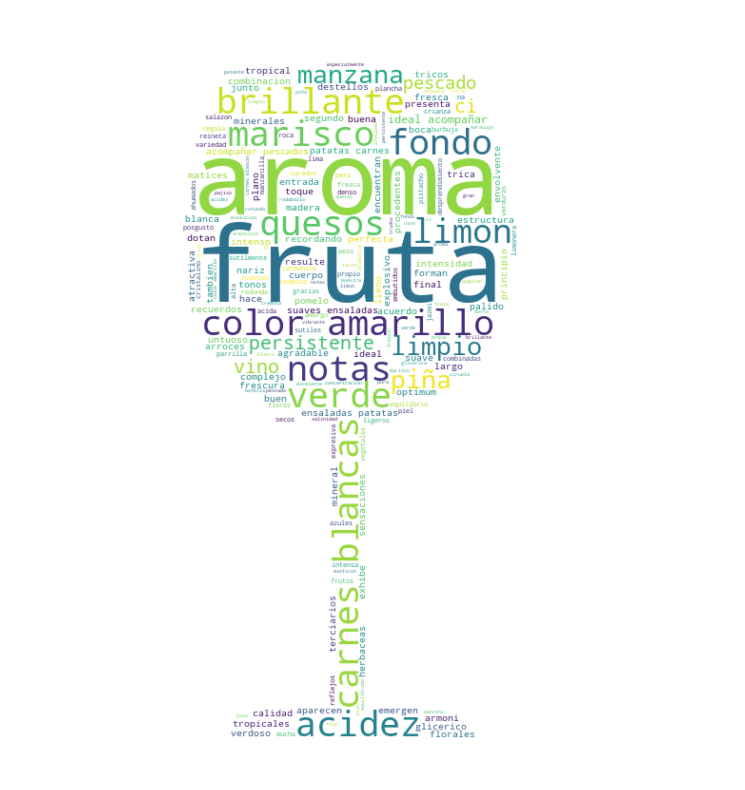

In [82]:
import numpy as np
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from PIL import Image

# Concatenar todas las descripciones en un solo texto
all_descriptions = resultados_recomendaciones['descripcion2'].str.cat(sep=' ').lower()

# Cargar la imagen de la máscara
mask = np.array(Image.open("copa_vino.png"))  # Asegúrate de que la imagen "copa_vino.png" esté en tu carpeta de trabajo

# Configurar la WordCloud con la máscara y generar la nube de palabras
wc = WordCloud(background_color="white", repeat=True, mask=mask, colormap='viridis').generate(all_descriptions)

# Crear y mostrar la figura
plt.figure(figsize=(15, 10))  # Modifica el tamaño aquí (ancho, alto)
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
#plt.title("Nube de palabras - Descripciones de Vinos", fontsize=20, fontweight="bold", color="black", style="italic")

# # Guardar el plot como jpg
plt.savefig('cloud_copa_albariño.jpg')

plt.show()

### 5.3 Prueba con todos los vinos generosos y maridaje

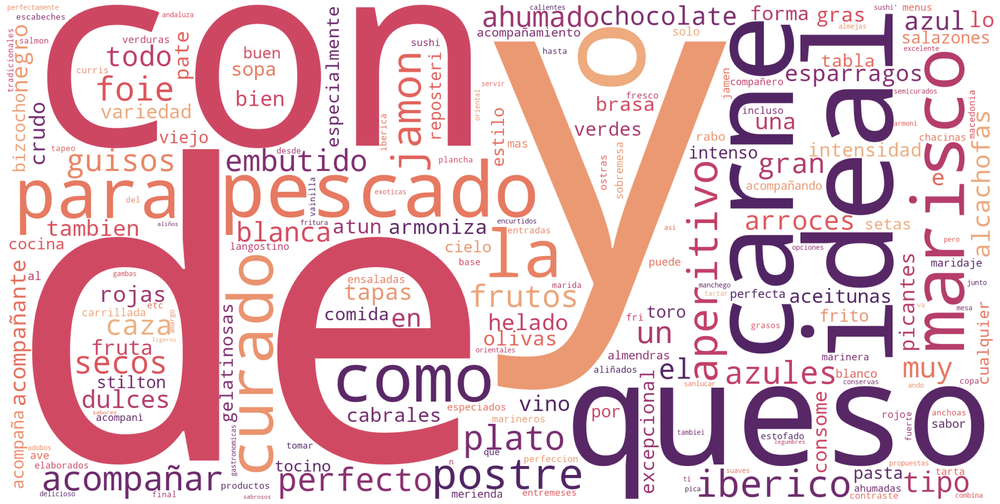

In [86]:
generosos=  data[data["tipo2"] == "generoso"]

# NUBE PARA todos los tintos
all_words_str = generosos['maridaje'].str.cat(sep=' ')
all_words_str = all_words_str.lower()

# Función para graficar la nube de palabras
def plot_cloud(wordcloud):
    plt.figure(figsize=(30, 20))
    plt.imshow(wordcloud) 
    plt.axis("off")
    plt.savefig('wordcloud_generosos.jpg')  # Guardar la imagen como wordcloud.jpg
    plt.show()

# Generar la nube de palabras
wordcloud = WordCloud(width=2000, height=1000, random_state=1, background_color='white', 
                      colormap='flare', collocations=False).generate(all_words_str)

# # Guardar el plot como jpg
# plt.savefig('cloud_.jpg')

# Mostrar y guardar la nube de palabras
plot_cloud(wordcloud)